In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Pip install method (recommended)
%pip install ultralytics
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.5/756.5 kB 10.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-man

In [ ]:
!pip install squarify

In [ ]:
# Importing the required libraries
from ultralytics import YOLO
# import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns

sns.set_style('darkgrid')

%matplotlib inline

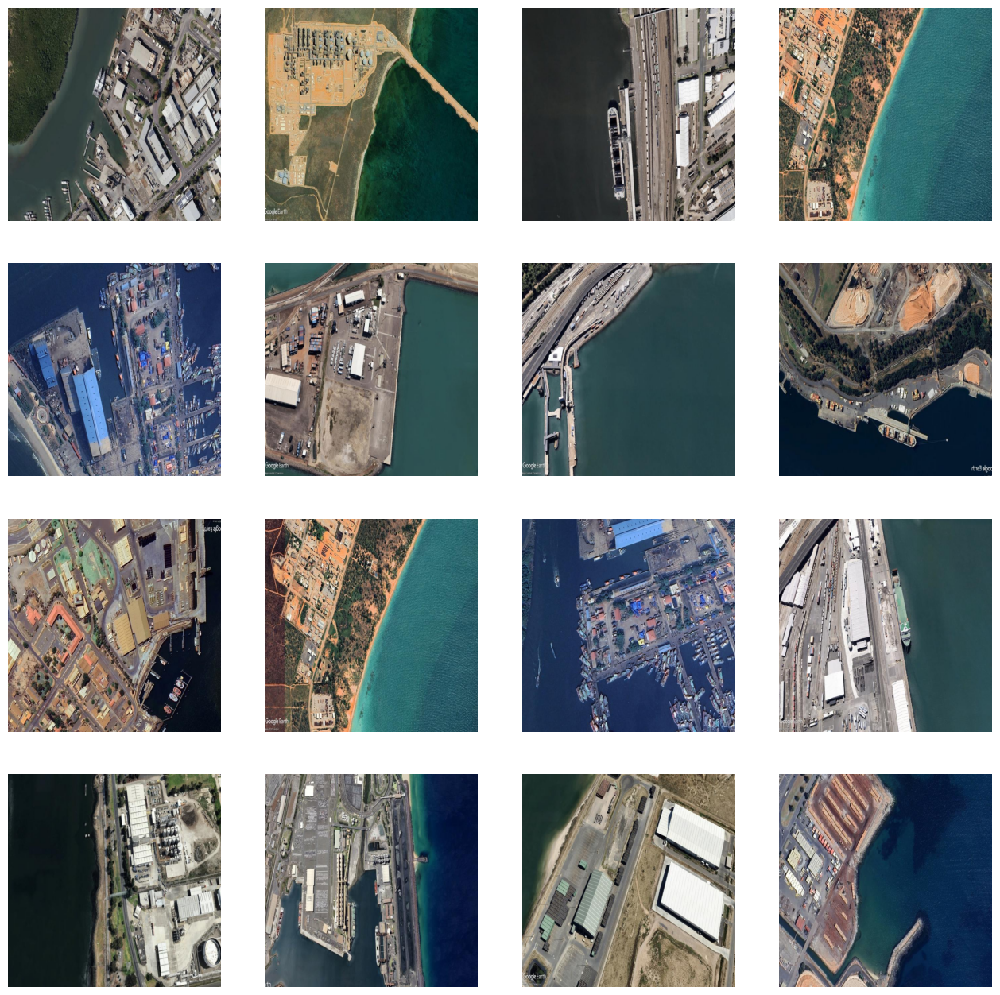

In [ ]:
# Define the paths to the images and labels directories
train_images = "/content/drive/MyDrive/Ship Port1.v1i.yolov8/train/images"
train_labels = "/content/drive/MyDrive/Ship Port1.v1i.yolov8/train/labels"

test_images = "/content/drive/MyDrive/Ship Port1.v1i.yolov8/test/images"
test_labels = "/content/drive/MyDrive/Ship Port1.v1i.yolov8/test/labels"

val_images = "/content/drive/MyDrive/Ship Port1.v1i.yolov8/valid/images"
val_labels = "/content/drive/MyDrive/Ship Port1.v1i.yolov8/valid/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4

    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()


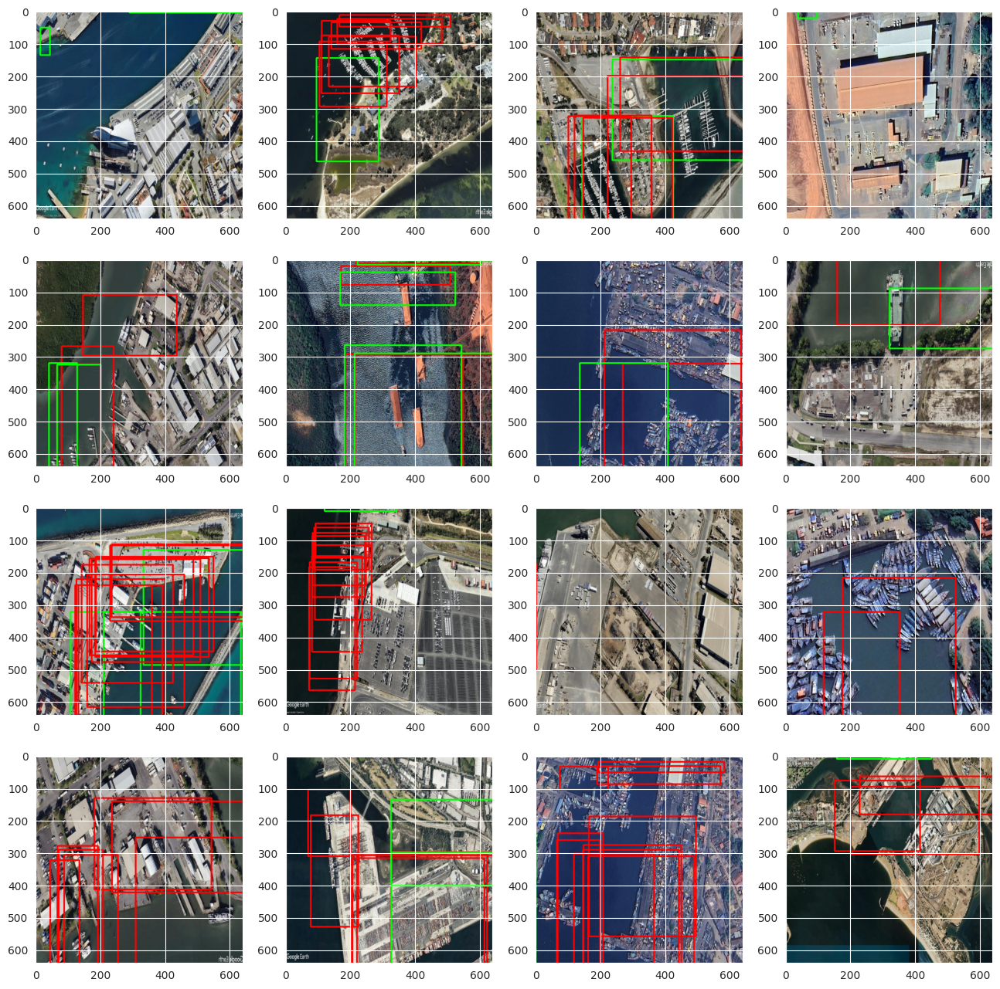

In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# Define the paths to the images and labels directories
train_images = "/content/drive/MyDrive/Ship Port1.v1i.yolov8/train/images"
train_labels = "/content/drive/MyDrive/Ship Port1.v1i.yolov8/train/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)



# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4

    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        lines = f.readlines()

    # Loop over the labels and plot the object detections
    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        x_center = float(parts[1])
        y_center = float(parts[2])
        width = float(parts[3])
        height = float(parts[4])

        # Calculate bounding box coordinates
        image_height, image_width, _ = image.shape
        x_min = int((x_center - width / 2) * image_width)
        y_min = int((y_center - height / 2) * image_height)
        x_max = int((x_center + width / 2) * image_width)
        y_max = int((y_center + height / 2) * image_height)

        # Draw bounding box
        color = (0, 255, 0)  # Default color for now
        if class_id == 1:
            color = (0, 0, 255)  # Red color for class 1
        elif class_id == 2:
            color = (255, 0, 0)  # Blue color for class 2

        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color, 3)

    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('on')

plt.show()



In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# Define the paths to the images and labels directories
train_images_dir = "/content/drive/MyDrive/Ship Port1.v1i.yolov8/train/images"
train_labels_dir = "/content/drive/MyDrive/Ship Port1.v1i.yolov8/train/labels"
test_images_dir = "/content/drive/MyDrive/Ship Port1.v1i.yolov8/test/images"
test_labels_dir = "/content/drive/MyDrive/Ship Port1.v1i.yolov8/test/labels"

# Get a list of all the image files in the training images directory
train_image_files = os.listdir(train_images_dir)
test_image_files = os.listdir(test_images_dir)

# Construct the full paths to the label files corresponding to each image
train_label_files = [os.path.join(train_labels_dir, os.path.splitext(image_file)[0] + ".txt") for image_file in train_image_files]
test_label_files = [os.path.join(test_labels_dir, os.path.splitext(image_file)[0] + ".txt") for image_file in test_image_files]

# Choose 16 random image files from the training set
random_train_images = random.sample(train_image_files, 8)

# Choose 8 random image files from the test set
random_test_images = random.sample(test_image_files, 8)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random training images and plot the object detections
for i, image_file in enumerate(random_train_images):
    row = i // 4
    col = i % 4

    # Load the image
    image_path = os.path.join(train_images_dir, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_path = train_label_files[i]
    with open(label_path, "r") as f:
        lines = f.readlines()

    # Define colors for different classes
    class_colors = {
        1: (0, 255, 0),  # Green for ships and ship ports
        2: (0, 0, 255)   # Red for containers
    }

    # Loop over the labels and plot the object detections
    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        x_center = float(parts[1])
        y_center = float(parts[2])
        width = float(parts[3])
        height = float(parts[4])

        # Calculate bounding box coordinates
        image_height, image_width, _ = image.shape
        x_min = int((x_center - width / 2) * image_width)
        y_min = int((y_center - height / 2) * image_height)
        x_max = int((x_center + width / 2) * image_width)
        y_max = int((y_center + height / 2) * image_height)

        # Draw bounding box with class-specific color
        color = class_colors.get(class_id, (0, 0, 0))  # Default to black if class color is not defined
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color, 3)

    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('on')

# Loop over the random test images and plot the object detections
for i, image_file in enumerate(random_test_images, len(random_train_images)):
    row = i // 4
    col = i % 4

    # Load the image
    image_path = os.path.join(test_images_dir, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_path = test_label_files[i - len(random_train_images)]
    with open(label_path, "r") as f:
        lines = f.readlines()

    # Loop over the labels and plot the object detections
    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        x_center = float(parts[1])
        y_center = float(parts[2])
        width = float(parts[3])
        height = float(parts[4])

        # Calculate bounding box coordinates
        image_height, image_width, _ = image.shape
        x_min = int((x_center - width / 2) * image_width)
        y_min = int((y_center - height / 2) * image_height)
        x_max = int((x_center + width / 2) * image_width)
        y_max = int((y_center + height / 2) * image_height)

        # Draw bounding box with class-specific color
        color = class_colors.get(class_id, (0, 0, 0))  # Default to black if class color is not defined
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color, 3)

    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('on')

plt.show()



In [ ]:
image = cv2.imread("/content/drive/MyDrive/Ship Port1.v1i.yolov8/test/images/10_jpg.rf.ba22be578b860143148d4beebb11d20b.jpg")

# Get the size of the image
height, width, channels = image.shape
print(f"The image has dimensions {width}x{height} and {channels} channels.")

The image has dimensions 640x640 and 3 channels.


In [ ]:
 # Loading a pretrained model
model = YOLO('yolov8x.pt')

# Training the model
model.train(data = '/content/drive/MyDrive/Ship Port1.v1i.yolov8/data.yaml',
            epochs = 15,
            imgsz = height,
            seed = 42,
            batch = 8,
            workers = 4)

100%|██████████| 131M/131M [00:00<00:00, 200MB/s]


Ultralytics YOLOv8.2.11 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=/content/drive/MyDrive/Ship Port1.v1i.yolov8/data.yaml, epochs=15, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=4, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels

100%|██████████| 755k/755k [00:00<00:00, 25.0MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 
  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               
  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           
  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              
  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320, 6, True]           
  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              
  6                  -1  6  13117440  ultralytics.nn.modules.block.C2f             [640, 640, 6, True]           
  7                  -1  1   3687680  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 116MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/Ship Port1.v1i.yolov8/train/labels.cache... 555 images, 6 backgrounds, 0 corrupt: 100%|██████████| 555/555 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/Ship Port1.v1i.yolov8/train/images/img74_jpg.rf.03eb882141206b8f10e2c6e6c16c12d4.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/Ship Port1.v1i.yolov8/train/images/img74_jpg.rf.b6840f6c9cd132f06a25bde0db785931.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/Ship Port1.v1i.yolov8/train/images/img74_jpg.rf.c2a18115fc9685b496be03f9a40d8d03.jpg: 1 duplicate labels removed


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/Ship Port1.v1i.yolov8/valid/labels.cache... 54 images, 0 backgrounds, 0 corrupt: 100%|██████████| 54/54 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15      7.91G      1.235      2.013      1.437         17        640: 100%|██████████| 70/70 [00:48<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.05s/it]

                   all         54        235     0.0025      0.125    0.00135   0.000541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      7.66G      1.457      1.903      1.589         30        640: 100%|██████████| 70/70 [00:44<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.77it/s]

                   all         54        235     0.0359      0.103     0.0298    0.00773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      7.64G      1.527      1.876      1.646         18        640: 100%|██████████| 70/70 [00:45<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.34it/s]

                   all         54        235     0.0965      0.238     0.0434     0.0187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      7.64G      1.421      1.781      1.555         17        640: 100%|██████████| 70/70 [00:46<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.80it/s]

                   all         54        235     0.0165      0.198    0.00598    0.00251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      7.65G      1.314      1.596      1.497         29        640: 100%|██████████| 70/70 [00:46<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.25it/s]

                   all         54        235      0.469      0.444      0.366      0.201


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      7.65G      1.436      1.803      1.622         22        640: 100%|██████████| 70/70 [00:48<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.25it/s]

                   all         54        235      0.568      0.442      0.446      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      7.65G      1.376      1.729       1.57          5        640: 100%|██████████| 70/70 [00:46<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.81it/s]

                   all         54        235      0.573      0.415      0.414      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      7.64G       1.32       1.65      1.532         23        640: 100%|██████████| 70/70 [00:46<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all         54        235      0.534      0.448      0.435      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      7.65G      1.265      1.619      1.489         12        640: 100%|██████████| 70/70 [00:47<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]

                   all         54        235      0.565      0.497      0.483      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      7.66G      1.226      1.554      1.459         18        640: 100%|██████████| 70/70 [00:46<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all         54        235      0.604      0.517      0.528      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15      7.64G      1.169      1.455      1.427          7        640: 100%|██████████| 70/70 [00:46<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all         54        235      0.585      0.546      0.527      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      7.65G       1.11       1.36      1.376         13        640: 100%|██████████| 70/70 [00:47<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all         54        235      0.712      0.559       0.58      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      7.65G      1.068      1.268      1.337         24        640: 100%|██████████| 70/70 [00:47<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]

                   all         54        235      0.639      0.578      0.572      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      7.64G      1.009      1.222      1.306          6        640: 100%|██████████| 70/70 [00:46<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.34it/s]

                   all         54        235      0.666      0.554      0.593      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      7.67G     0.9504      1.185      1.263         29        640: 100%|██████████| 70/70 [00:47<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all         54        235      0.677      0.581      0.589      0.424



15 epochs completed in 0.224 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 136.7MB
Optimizer stripped from runs/detect/train/weights/best.pt, 136.7MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.11 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 68125494 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.20it/s]


                   all         54        235      0.666      0.554      0.592      0.425
                  port         54         77      0.786       0.62      0.705      0.517
                  ship         54        158      0.546      0.487       0.48      0.332
Speed: 0.4ms preprocess, 31.5ms inference, 0.0ms loss, 4.9ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b63f41b9d80>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

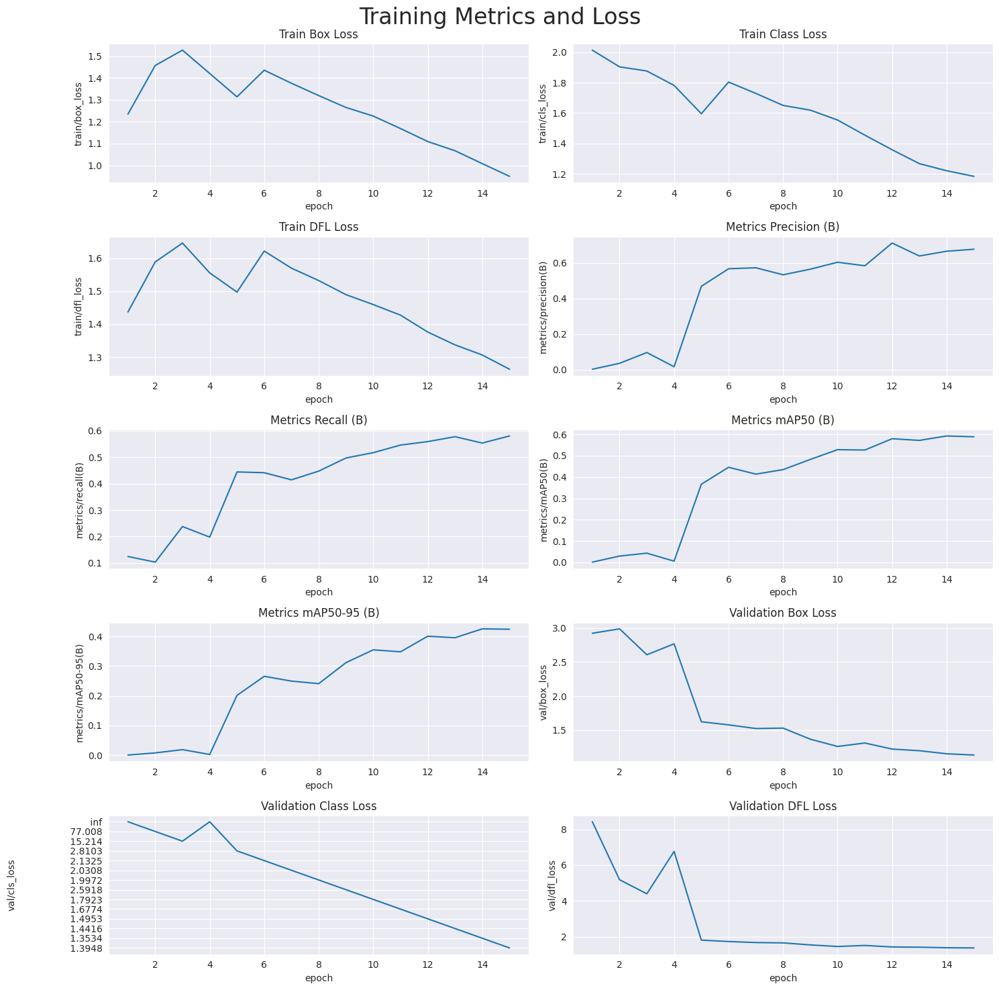

In [ ]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/content/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [ ]:
%matplotlib inline
# Loading the best performing model
model = YOLO('/content/drive/MyDrive/best v8 .pt')

# Evaluating the model on the test dataset
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics YOLOv8.2.11 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 268 layers, 68125494 parameters, 0 gradients, 257.4 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 10.9MB/s]
val: Scanning /content/drive/MyDrive/Ship Port1.v1i.yolov8/test/labels.cache... 26 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [03:04<00:00, 92.25s/it]


                   all         26        134      0.625      0.535      0.574      0.413
                  port         26         30      0.691      0.667      0.681      0.523
                  ship         26        104      0.559      0.404      0.467      0.302
Speed: 21.8ms preprocess, 6652.4ms inference, 0.0ms loss, 115.2ms postprocess per image
Results saved to runs/detect/val


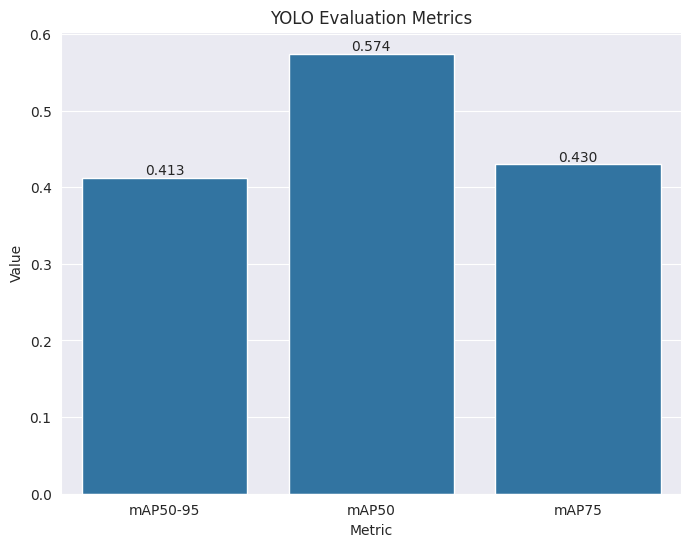

In [ ]:
%matplotlib inline
# Create the barplot
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])

# Set the title and axis labels
ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

# Set the figure size
fig = plt.gcf()
fig.set_size_inches(8, 6)

# Add the values on top of the bars
for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')

# Show the plot
plt.show()

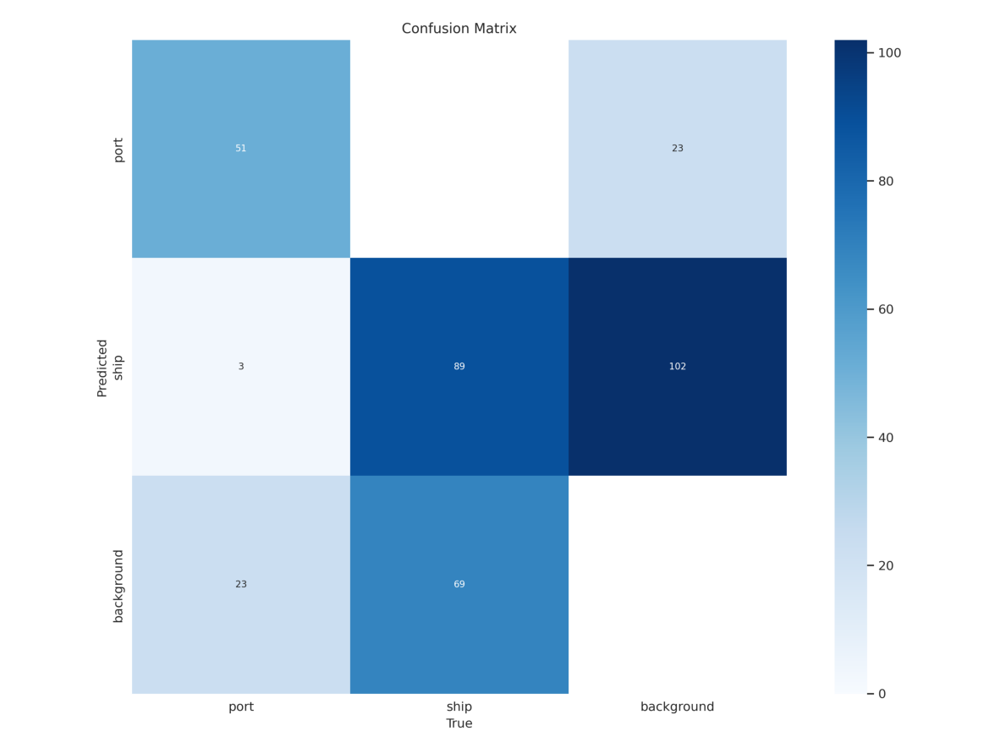

In [ ]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/content/runs/detect/train/confusion_matrix.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (15, 15))

ax.imshow(img)
ax.axis('off');

In [ ]:
def ship_detect(img):

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()

    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)

    return detect_img

In [ ]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/content/drive/MyDrive/Ship Port1.v1i.yolov8/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):

    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4

    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)

    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

In [ ]:
# Create subplots with proper layout
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 10))

# Plot validation metrics
sns.lineplot(x='epoch', y='val/box_loss', data=metrics_df, ax=axs[0], label='Validation Box Loss')
sns.lineplot(x='epoch', y='val/cls_loss', data=metrics_df, ax=axs[1], label='Validation Class Loss')

# Set titles and axis labels with improved font properties
axs[0].set_title('Validation Box Loss', fontsize=14, fontweight='bold')
axs[1].set_title('Validation Class Loss', fontsize=14, fontweight='bold')

# Add suptitle and adjust top margin
plt.suptitle('Validation Metrics', fontsize=24)
plt.subplots_adjust(top=0.9)

# Show the plot
plt.show()


In [ ]:
import tensorflow as tf

# Assuming 'model' is your TensorFlow model object
model.save('ship_port_detection_model')  # Save the entire model

# To save only the model weights
#model.save_weights('ship_detection_weights.h5')


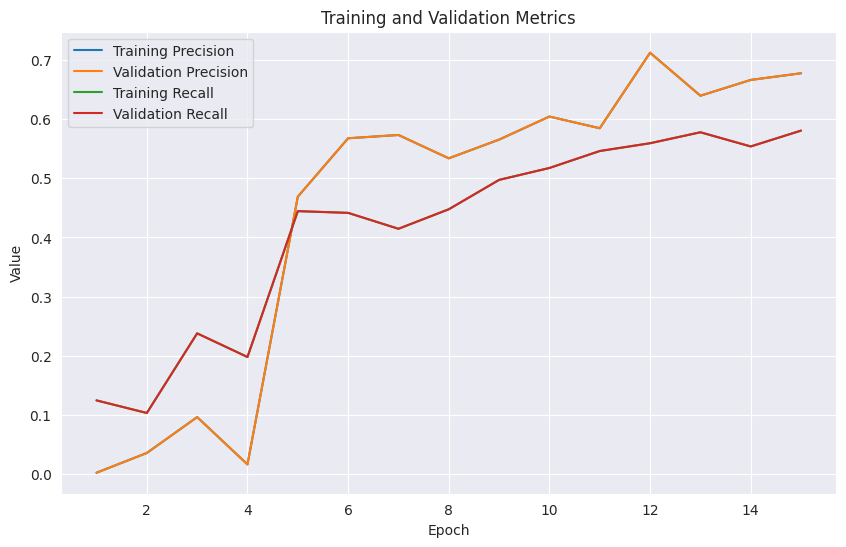

In [ ]:








# Remove leading spaces from column names
df.columns = df.columns.str.strip()

# Plot the training and validation metrics
plt.figure(figsize=(10, 6))
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, label='Training Precision')
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, label='Validation Precision')
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, label='Training Recall')
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, label='Validation Recall')

plt.title('Training and Validation Metrics')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.show()




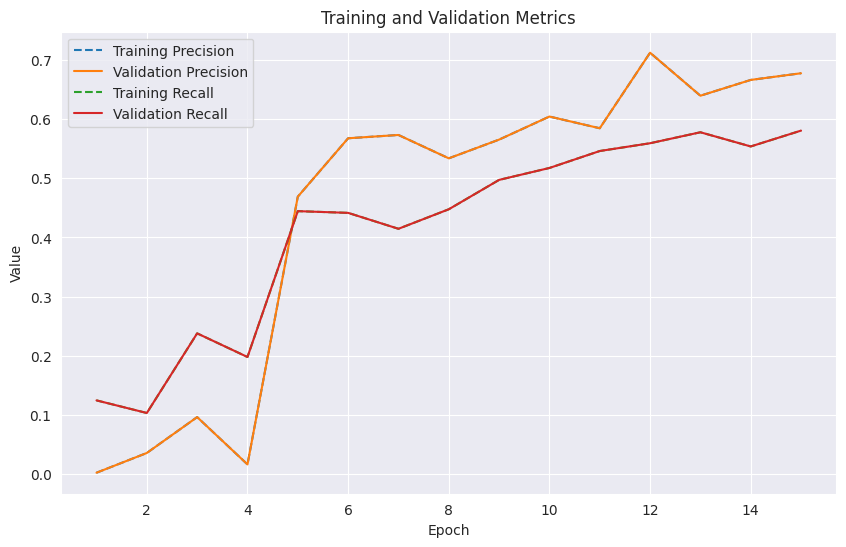

In [ ]:
# Remove leading spaces from column names
df.columns = df.columns.str.strip()

# Plot the training and validation metrics
plt.figure(figsize=(10, 6))

# Plot training precision with a dashed line
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, label='Training Precision', linestyle='--')

# Plot validation precision with a solid line
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, label='Validation Precision', linestyle='-')

# Plot training recall with a dashed line
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, label='Training Recall', linestyle='--')

# Plot validation recall with a solid line
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, label='Validation Recall', linestyle='-')

plt.title('Training and Validation Metrics')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.show()


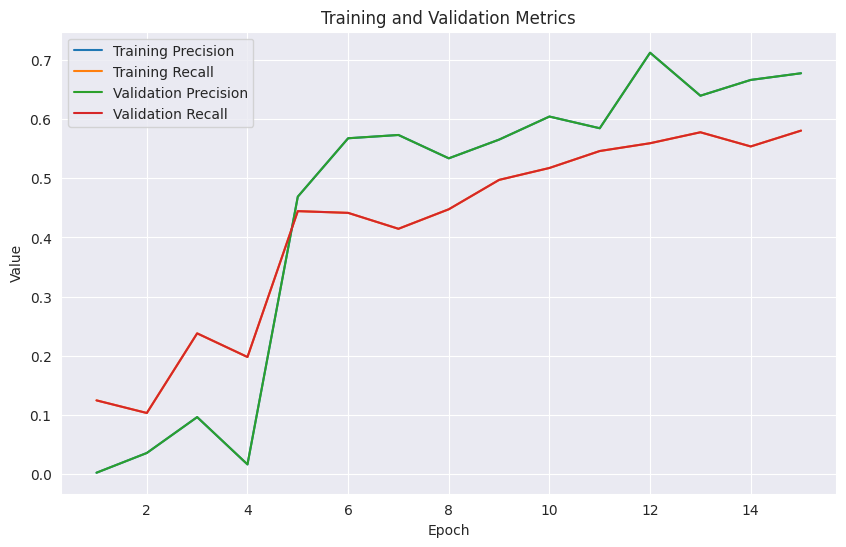

In [ ]:
# Read the results.csv file as a pandas DataFrame
df = pd.read_csv('/content/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# Plotting the training and validation precision
plt.figure(figsize=(10, 6))
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, label='Training Precision')
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, label='Training Recall')
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, label='Validation Precision')
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, label='Validation Recall')

plt.title('Training and Validation Metrics')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.show()


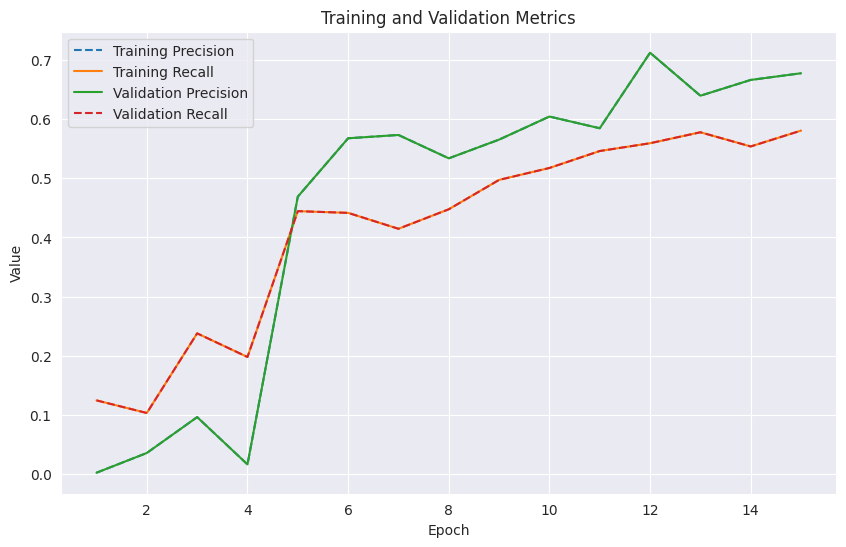

In [ ]:
# Read the results.csv file as a pandas DataFrame
df = pd.read_csv('/content/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# Plotting the training and validation metrics
plt.figure(figsize=(10, 6))

# Plot training precision
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, label='Training Precision', linestyle='--')

# Plot training recall
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, label='Training Recall', linestyle='-')

# Plot validation precision
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, label='Validation Precision', linestyle='-')

# Plot validation recall
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, label='Validation Recall', linestyle='--')

plt.title('Training and Validation Metrics')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.show()


In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load your trained YOLOv8 model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Load the sample image from your PC
sample_image_path = '/content/drive/MyDrive/pp.jpg'
sample_image = sample_image_path

# Perform object detection on the sample image
results = model(sample_image)

# Iterate over the results to access predictions for each image
for result in results:
    # Print the detected classes and confidence scores for the current image
    print(result.probs)

    # Display the sample image with bounding boxes drawn around detected objects
    result.show()






image 1/1 /content/drive/MyDrive/pp.jpg: 480x640 2 ports, 4 ships, 86.3ms
Speed: 2.7ms preprocess, 86.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
None



image 1/1 /content/drive/MyDrive/ps.jpg: 384x640 1 port, 7 ships, 2488.6ms
Speed: 7.4ms preprocess, 2488.6ms inference, 10.9ms postprocess per image at shape (1, 3, 384, 640)
None


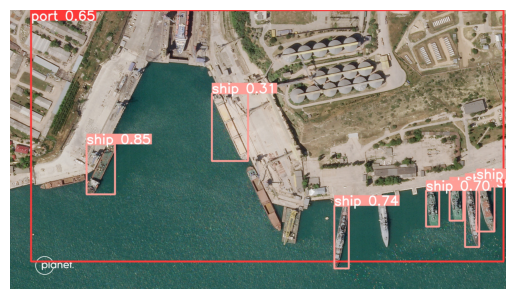

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load your trained YOLOv8 model
model = YOLO('/content/drive/MyDrive/best.pt')

# Load the sample image from your PC
sample_image_path = '/content/drive/MyDrive/ps.jpg'
sample_image = sample_image_path

# Perform object detection on the sample image
results = model(sample_image)

# Iterate over the results to access predictions for each image
for result in results:
    # Print the detected classes and confidence scores for the current image
    print(result.probs)

    # Save the annotated image to a file
    result.save("annotated_image.jpg")

    # Load and display the annotated image using matplotlib
    annotated_image = plt.imread("annotated_image.jpg")
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.show()



image 1/1 /content/drive/MyDrive/img1.jpeg: 480x640 1 port, 63.9ms
Speed: 2.8ms preprocess, 63.9ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)
None


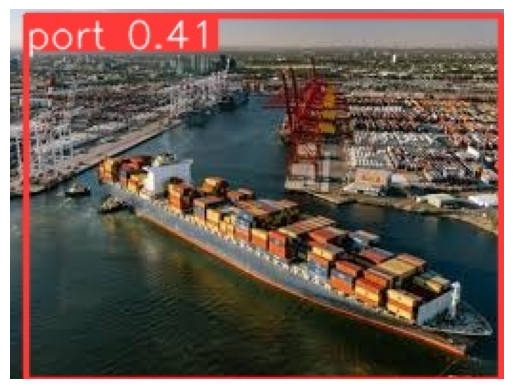

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load your trained YOLOv8 model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Load the sample image from your PC
sample_image_path = '/content/drive/MyDrive/img1.jpeg'
sample_image = sample_image_path

# Perform object detection on the sample image
results = model(sample_image)

# Iterate over the results to access predictions for each image
for result in results:
    # Print the detected classes and confidence scores for the current image
    print(result.probs)

    # Save the annotated image to a file
    result.save("annotated_image.jpg")

    # Load and display the annotated image using matplotlib
    annotated_image = plt.imread("annotated_image.jpg")
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.show()


image 1/1 /content/drive/MyDrive/img2.jpeg: 384x640 (no detections), 51.4ms
Speed: 1.9ms preprocess, 51.4ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)
None


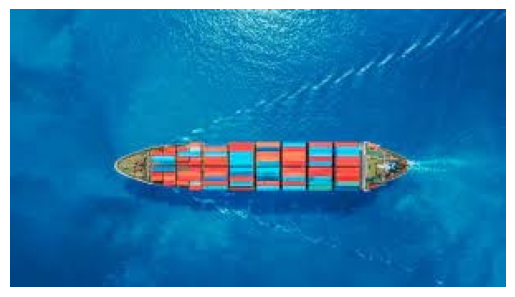

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load your trained YOLOv8 model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Load the sample image from your PC
sample_image_path = '/content/drive/MyDrive/img2.jpeg'
sample_image = sample_image_path

# Perform object detection on the sample image
results = model(sample_image)

# Iterate over the results to access predictions for each image
for result in results:
    # Print the detected classes and confidence scores for the current image
    print(result.probs)

    # Save the annotated image to a file
    result.save("annotated_image.jpg")

    # Load and display the annotated image using matplotlib
    annotated_image = plt.imread("annotated_image.jpg")
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.show()


image 1/1 /content/drive/MyDrive/pp.jpeg: 448x640 1 port, 435.6ms
Speed: 2.6ms preprocess, 435.6ms inference, 11.1ms postprocess per image at shape (1, 3, 448, 640)
None


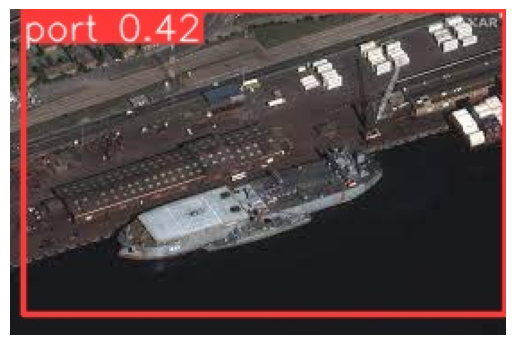

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load your trained YOLOv8 model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Load the sample image from your PC
sample_image_path = '/content/drive/MyDrive/pp.jpeg'
sample_image = sample_image_path

# Perform object detection on the sample image
results = model(sample_image)

# Iterate over the results to access predictions for each image
for result in results:
    # Print the detected classes and confidence scores for the current image
    print(result.probs)

    # Save the annotated image to a file
    result.save("annotated_image.jpg")

    # Load and display the annotated image using matplotlib
    annotated_image = plt.imread("annotated_image.jpg")
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.show()


image 1/1 /content/drive/MyDrive/img1.jpeg: 480x640 1 port, 69.0ms
Speed: 2.7ms preprocess, 69.0ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)
None


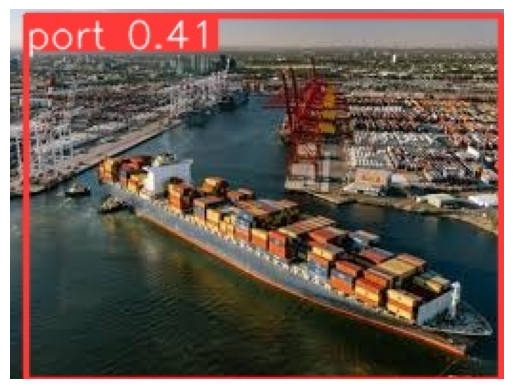

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load your trained YOLOv8 model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Load the sample image from your PC
sample_image_path = '/content/drive/MyDrive/img1.jpeg'
sample_image = sample_image_path

# Perform object detection on the sample image
results = model(sample_image)

# Iterate over the results to access predictions for each image
for result in results:
    # Print the detected classes and confidence scores for the current image
    print(result.probs)

    # Save the annotated image to a file
    result.save("annotated_image.jpg")

    # Load and display the annotated image using matplotlib
    annotated_image = plt.imread("annotated_image.jpg")
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.show()


image 1/1 /content/drive/MyDrive/pp.jpg: 480x640 2 ports, 4 ships, 60.7ms
Speed: 2.7ms preprocess, 60.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
None


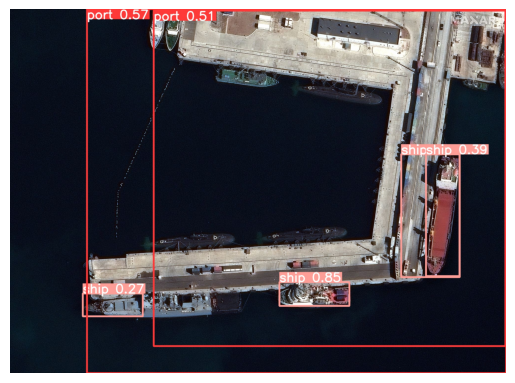

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load your trained YOLOv8 model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Load the sample image from your PC
sample_image_path = '/content/drive/MyDrive/pp.jpg'
sample_image = sample_image_path

# Perform object detection on the sample image
results = model(sample_image)

# Iterate over the results to access predictions for each image
for result in results:
    # Print the detected classes and confidence scores for the current image
    print(result.probs)

    # Save the annotated image to a file
    result.save("annotated_image.jpg")

    # Load and display the annotated image using matplotlib
    annotated_image = plt.imread("annotated_image.jpg")
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.show()


image 1/1 /content/drive/MyDrive/ps.jpg: 384x640 2 ports, 7 ships, 42.9ms
Speed: 2.2ms preprocess, 42.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
None


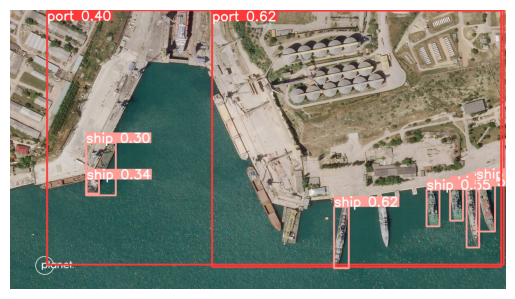

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load your trained YOLOv8 model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Load the sample image from your PC
sample_image_path = '/content/drive/MyDrive/ps.jpg'
sample_image = sample_image_path

# Perform object detection on the sample image
results = model(sample_image)

# Iterate over the results to access predictions for each image
for result in results:
    # Print the detected classes and confidence scores for the current image
    print(result.probs)

    # Save the annotated image to a file
    result.save("annotated_image.jpg")

    # Load and display the annotated image using matplotlib
    annotated_image = plt.imread("annotated_image.jpg")
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.show()


image 1/1 /content/drive/MyDrive/detect.jpg: 384x640 1 port, 3 ships, 45.3ms
Speed: 2.6ms preprocess, 45.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
None


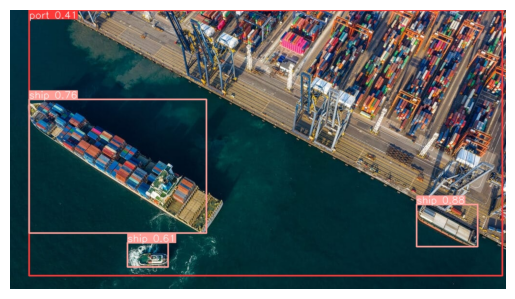

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load your trained YOLOv8 model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Load the sample image from your PC
sample_image_path = '/content/drive/MyDrive/detect.jpg'
sample_image = sample_image_path

# Perform object detection on the sample image
results = model(sample_image)

# Iterate over the results to access predictions for each image
for result in results:
    # Print the detected classes and confidence scores for the current image
    print(result.probs)

    # Save the annotated image to a file
    result.save("annotated_image.jpg")

    # Load and display the annotated image using matplotlib
    annotated_image = plt.imread("annotated_image.jpg")
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.show()


image 1/1 /content/drive/MyDrive/detect_1.jpg: 416x640 2 ports, 2 ships, 104.1ms
Speed: 2.3ms preprocess, 104.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
None


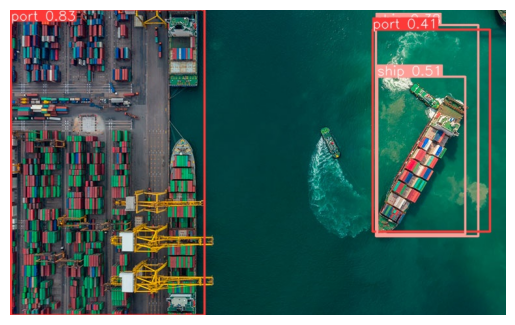

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load your trained YOLOv8 model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Load the sample image from your PC
sample_image_path = '/content/drive/MyDrive/detect_1.jpg'
sample_image = sample_image_path

# Perform object detection on the sample image
results = model(sample_image)

# Iterate over the results to access predictions for each image
for result in results:
    # Print the detected classes and confidence scores for the current image
    print(result.probs)

    # Save the annotated image to a file
    result.save("annotated_image.jpg")

    # Load and display the annotated image using matplotlib
    annotated_image = plt.imread("annotated_image.jpg")
    plt.imshow(annotated_image)
    plt.axis("off")
    plt.show()

In [ ]:
model.save('yolov8')

In [ ]:
# Creating the gradio interface for the model
!pip install gradio --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 60.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.0/92.0 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.6/314.6 kB 27.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.5/142.5 kB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 53.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.2/47.2 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 6.8 MB/s et

In [ ]:
import gradio as gr

input_image = gr.Image(label="Input Image")
output_image = gr.Image(label="Processed Image")

# Create the Gradio interface with a clear title and informative error message
interface = gr.Interface(
    fn=ship_detect,
    inputs=input_image,
    outputs=output_image,
    title="Ship Port Detection",
    description="This interface is currently under development. It is used to identify the ships and ports in the images.")

# Launch the interface
interface.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://1a51541802695ed3d3.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)
